##  <span style="color:#00B8DE"> Denoising via Singular Value decomposition (SVD) </span><a name="PCA-denoising"></a>

In this notebook, we use SVD: Singular Value decomposition to denoise 50 generated images representing the same function $f(x,y)=1_{\{x^2+y^2\leq 1\}}(x,y)$ over the area $[-1.2,-1.2]\times[1.2,1.2]$, each in the presence of white Gaussian noise with variance 1. 
Generated images are of size $100\times 100$. 

In a second paet we assume that images amplitudes $f(x,y)$ are in addition affected by a uniform normal Gaussian amplitude. 

In [1]:
using Plots
using Distributions
pyplot(size=(500,300))
function f(x,y)
    if x^2+y^2>1
        return 0 
    else 
        return 1 
    end
end
function generate_images(grid_size, noise_std)
    x_range = LinRange(-1.2 , 1.2 , grid_size) 
    y_range = LinRange(-1.2 , 1.2 , grid_size)
    Im = [ f(x,y)+ rand(Normal(0, noise_std)) for  x in x_range, y in y_range] #gaussian noise for each pixel 
    return Im
end 
nb_images = 50 
grid_size=100
noise_std = 1
images = zeros(grid_size, grid_size, nb_images) 
for i in 1: nb_images
    images[:,:,i]= generate_images(grid_size, noise_std)
end 

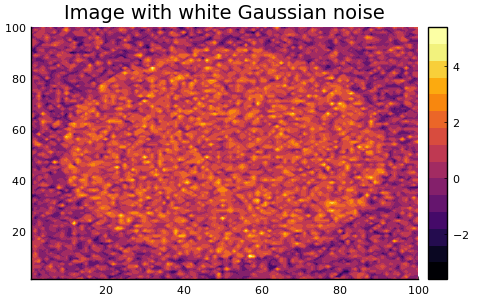

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [2]:
contourf(images[:,:,1])
title!("Image with white Gaussian noise")

SVD is often used for image compression and noise reduction by decomposing the image matrix into its component parts and filtering out lower-rank components that typically represent noise.

cumulative variance: 0.5338018033412769

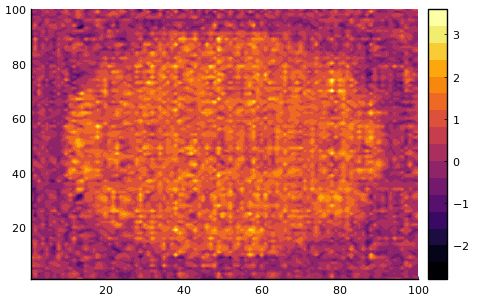

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [3]:
using LinearAlgebra: svd, Diagonal
using Statistics: mean,std
img = images[:,:,1]
U , S, V = svd(img)
rank_approx=10

cumulative_var = sum(S[i]^2 for i in 1: rank_approx) / sum(S[i]^2 for i in 1: length(S))
print("cumulative variance: ", cumulative_var) 
#Denoising the image
S = Diagonal(S)
denoised_image = U[:, 1: rank_approx] * S[1:rank_approx, 1:rank_approx] * transpose(V[:, 1:rank_approx ])
contourf(denoised_image)

(10000, 50)

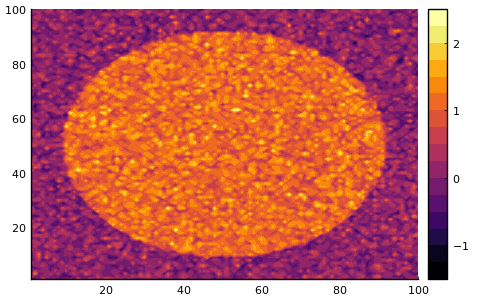

sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'
sys:1: UserWarning: The following kwargs were not used by contour: 'label'


In [4]:
M = reshape(images, grid_size^2, nb_images)
function denoise_images(rank_approx, images)
    U,S,V = svd(images)
    S= Diagonal(S[1:rank_approx])
    denoised_images = U[:, 1:rank_approx] * S * transpose(V[:, 1:rank_approx])
    return(denoised_images)
end 
denoised_images = denoise_images(10, M)
print(size(denoised_images))
denoised_images = reshape(denoised_images, (100,100,50))
contourf(denoised_images[:,:,1])

The second method is inherently better for denoising because it takes advantage of more data and can discern patterns across multiple images, resulting in a more accurate representation of shapes and details.

In [5]:
using LinearAlgebra
#Calculating the MSE
MSE = (1/(nb_images*grid_size^2)) * sum(norm(images[:,:,i] - denoised_images[:,:,i])^2 for i in 1:nb_images)

0.7800168070937935

In [8]:
x_range = LinRange(-1.2 , 1.2 , grid_size) 
y_range = LinRange(-1.2 , 1.2 , grid_size)
function generate_images_with_normal_amplitude(grid_size, noise_std)
    x_range = LinRange(-1.2 , 1.2 , grid_size) 
    y_range = LinRange(-1.2 , 1.2 , grid_size)
    A = Normal()
    Im = [rand(A)*f(x,y) for  x in x_range, y in y_range] #gaussian amplitude and noise for each pixel 
    return Im
end 
images_amp = zeros(grid_size,grid_size , nb_images) 
for i in 1: nb_images
    images_amp[:,:,i]= generate_images_with_normal_amplitude(grid_size, noise_std)
end 
#contourf(x_range, y_range, images_amp[:,:,1])

In [ ]:
N = reshape(images_amp, grid_size^2, nb_images)
images_amp_denoised = reshape(denoise_images(30, N), grid_size, grid_size, nb_images) 
#contourf(x_range, y_range,images_amp_denoised[:,:,1], nlevels=100)